In [44]:
import os
import torch
import trimesh
import matplotlib
import math
from typing import List, Dict
from pytorch3d.io import load_obj, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance, 
    mesh_edge_loss, 
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
import numpy as np
from tqdm.notebook import tqdm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

In [45]:
trg_obj = '1000F.obj'

verts, faces, aux = load_obj(trg_obj)

faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

trg_mesh = Meshes(verts=[verts], faces=[faces_idx])

src_mesh = ico_sphere(4, device)

d:\anaconda3\envs\p39\lib\site-packages\pytorch3d\io\obj_io.py:544: UserWarning: No mtl file provided
  warnings.warn("No mtl file provided")


In [46]:
def plot_point_cloud(mesh, title: str = '', fig = None, position: List[int] = None) -> None:
    points = sample_points_from_meshes(mesh, 5000)
    x, y, z = points.clone().detach().cpu().squeeze().unbind(1)

    if fig is None:
        fig = plt.figure()
        ax = fig.add_subplot(1, 1, 1, projection='3d')
    else:
        row, col, index = position
        ax = fig.add_subplot(row, col, index, projection='3d')

    ax.scatter3D(x, z, -y, s=1)

    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')

    ax.set_title(title)

    ax.view_init(190, 30)

    if fig is None:
        plt.show()

In [47]:
def plot_multiple_plots(meshes, n_cols: int = 2) -> None:
    n_rows = len(meshes) // n_cols
    n_rows = n_rows if len(meshes) % n_cols == 0 else n_rows + 1

    fig = plt.figure(figsize=(12, 4 * n_rows))

    for index, (name, mesh) in enumerate(meshes):
        plot_point_cloud(mesh, name, fig=fig, position=[n_rows, n_cols, index + 1])

    plt.show()

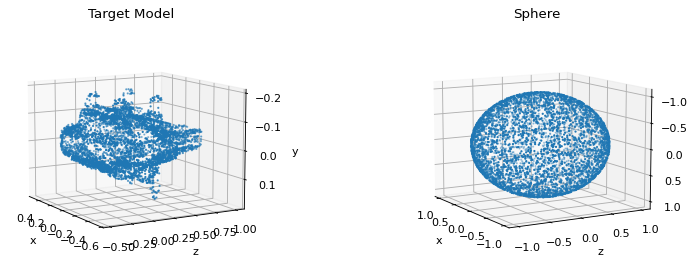

In [48]:
plot_multiple_plots([('Target Model', trg_mesh), ('Sphere', src_mesh)])

In [49]:
deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)

In [50]:
optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)

  0%|          | 0/1000 [00:00<?, ?it/s]

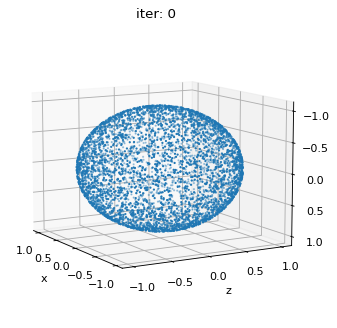

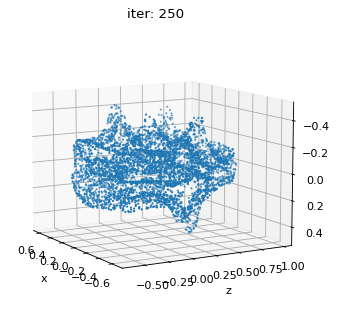

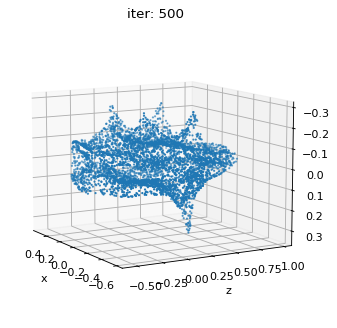

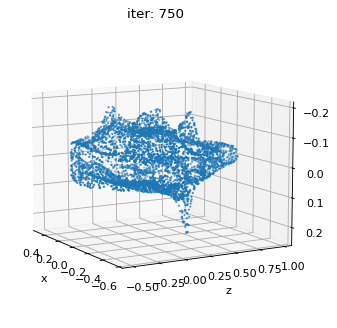

In [51]:
Niter = 1000
w_chamfer = 1.0 
w_edge = 1.0 
w_normal = 0.01 
w_laplacian = 0.1 

plot_period = 250
loop = tqdm(range(Niter))

chamfer_losses = []
laplacian_losses = []
edge_losses = []
normal_losses = []

for i in loop:
    # Initialize optimizer
    optimizer.zero_grad()
    
    # Deform the mesh
    new_src_mesh = src_mesh.offset_verts(deform_verts)
    
    # We sample 5k points from the surface of each mesh 
    sample_trg = sample_points_from_meshes(trg_mesh, 5000)
    sample_src = sample_points_from_meshes(new_src_mesh, 5000)
    
    # We compare the two sets of pointclouds by computing (a) the chamfer loss
    loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
    
    # and (b) the edge length of the predicted mesh
    loss_edge = mesh_edge_loss(new_src_mesh)
    
    # mesh normal consistency
    loss_normal = mesh_normal_consistency(new_src_mesh)
    
    # mesh laplacian smoothing
    loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
    
    # Weighted sum of the losses
    loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
    
    # Print the losses
    loop.set_description('total_loss = %.6f' % loss)
    
    # Save the losses for plotting
    chamfer_losses.append(float(loss_chamfer.detach().cpu()))
    edge_losses.append(float(loss_edge.detach().cpu()))
    normal_losses.append(float(loss_normal.detach().cpu()))
    laplacian_losses.append(float(loss_laplacian.detach().cpu()))
    
    # Plot mesh
    if i % plot_period == 0:
        plot_point_cloud(new_src_mesh, title="iter: %d" % i)
        
    # Optimization step
    loss.backward()
    optimizer.step()

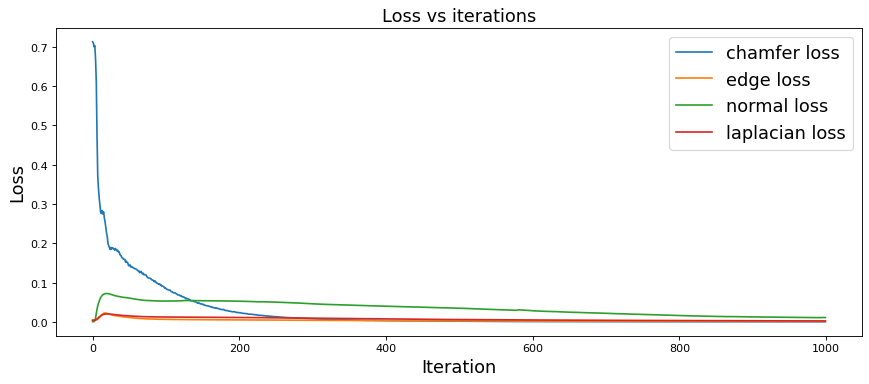

In [52]:
fig = plt.figure(figsize=(13, 5))
ax = fig.gca()
ax.plot(chamfer_losses, label="chamfer loss")
ax.plot(edge_losses, label="edge loss")
ax.plot(normal_losses, label="normal loss")
ax.plot(laplacian_losses, label="laplacian loss")
ax.legend(fontsize="16")
ax.set_xlabel("Iteration", fontsize="16")
ax.set_ylabel("Loss", fontsize="16")
ax.set_title("Loss vs iterations", fontsize="16");

In [53]:
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

# Scale normalize back to the original target size
final_verts = final_verts * scale + center

# Store the predicted mesh using save_obj
final_obj = 'fmodel.obj'
save_obj(final_obj, final_verts, final_faces)

In [54]:
m1 = trimesh.load('fmodel.obj')
direction = [0, 0, 1]
center = [0, 0, 0]

m1.apply_transform(trimesh.transformations.rotation_matrix(math.pi, direction, center))
m1.show()


m1.show()

In [55]:
m2 = trimesh.load('1000F.obj')
direction = [0, 0, 1]
center = [0, 0, 0]

m2.apply_transform(trimesh.transformations.rotation_matrix(math.pi, direction, center))
m2.show()
m2.show()